In [1]:
import tensorflow as tf
from tensorflow import keras, data
from tensorflow.keras import layers, models, utils

import matplotlib.pyplot as plt
import numpy as np
import glob
import cv2
import pandas as pd
from tqdm.notebook import tqdm
import os

2024-03-07 14:28:57.378755: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-07 14:28:57.378797: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-07 14:28:57.380231: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-07 14:28:57.387292: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-07 14:28:58.748934: W tensorflow/compiler/tf2

In [2]:
IMG_SIZE=96
BATCH_SIZE=64
LATENT_DIM=64

In [3]:
dataset_path = 'faces/'

processed = []

# Iterate through images, crop, scale and store them in 'processed' array
for img in tqdm(os.listdir(dataset_path)):
    img = cv2.imread(dataset_path+img) #read image
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)           #convert to RGB
    img = cv2.resize(img,(IMG_SIZE,IMG_SIZE))           #resize
    img = tf.cast(img,'float32')/127.5 - 1              #normalize image to [-1,1]
    processed.append(img)                               #store in array

  0%|          | 0/29042 [00:00<?, ?it/s]

2024-03-07 14:30:44.903493: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-07 14:30:44.996082: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-07 14:30:44.996746: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [4]:
# Create a tensorflow dataset from given data, shuffle images and group them into batches
limit_training = 10000
test = 300

processed = np.array(processed)
np.random.shuffle(processed)

train_dataset = data.Dataset.from_tensor_slices(processed[:limit_training]) \
                .shuffle(1024, reshuffle_each_iteration=True) \
                .batch(BATCH_SIZE)

test_dataset = data.Dataset.from_tensor_slices(processed[limit_training:limit_training + test]).batch(BATCH_SIZE)
print(train_dataset,test_dataset)

2024-03-07 14:32:35.667424: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1105920000 exceeds 10% of free system memory.


<_BatchDataset element_spec=TensorSpec(shape=(None, 96, 96, 3), dtype=tf.float32, name=None)> <_BatchDataset element_spec=TensorSpec(shape=(None, 96, 96, 3), dtype=tf.float32, name=None)>


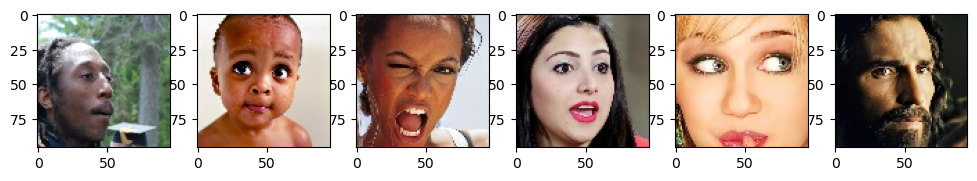

In [5]:
# Take a look at the dataset
imgs = next(iter(test_dataset))
fig = plt.figure(figsize=(12, 8))
rows = 6
for i in range(rows):
    fig.add_subplot(1,rows,i+1)
    plt.imshow((imgs[i]+1)*0.5) #scale images back to [0,1] in order to show them
plt.show()

In [6]:
class DownsampleBlock(layers.Layer):
    def __init__(self, filters, size, strides=2, padding='same',  use_bn=True):
        super().__init__()
        
        self.stack = keras.Sequential()
        self.stack.add(layers.Conv2D(filters, size, strides, padding))
            
        if use_bn:
            self.stack.add(layers.BatchNormalization(momentum=0.5))

        self.stack.add(layers.LeakyReLU(alpha=0.2))

    def call(self, inputs):
        return self.stack(inputs)

In [7]:
class UpsampleBlock(layers.Layer):
    def __init__(self, filters, size=4, strides=2, padding='same', use_bn=True):
        super().__init__()
        
        self.stack = keras.Sequential()
        self.stack.add(layers.Conv2DTranspose(filters, size, strides, padding))
        
        if use_bn:
            self.stack.add(layers.BatchNormalization(momentum=0.5))
            
        self.stack.add(layers.ReLU())

    def call(self, inputs):
        return self.stack(inputs)

In [24]:
def create_generator(input_size=LATENT_DIM):
    inp = layers.Input(shape=(input_size,))
    x = layers.Dense(6*6*512)(inp)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Reshape((6,6,512))(x)
    x = UpsampleBlock(256,5)(x)
    x = UpsampleBlock(128,5)(x)
    x = UpsampleBlock(64,5)(x)
    x = layers.Conv2DTranspose(3, kernel_size=4, strides=2, padding="same", activation="tanh")(x)
    return keras.models.Model(inp,x,name="generator")

generator = create_generator()
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 64)]              0         
                                                                 
 dense_13 (Dense)            (None, 18432)             1198080   
                                                                 
 batch_normalization_52 (Ba  (None, 18432)             73728     
 tchNormalization)                                               
                                                                 
 re_lu_42 (ReLU)             (None, 18432)             0         
                                                                 
 reshape_10 (Reshape)        (None, 6, 6, 512)         0         
                                                                 
 upsample_block_32 (Upsampl  (None, 12, 12, 256)       3278080   
 eBlock)                                                 

In [ ]:
class MinibatchDiscrimination(layers.Layer):

    def __init__(self, num_kernel, dim_kernel,kernel_initializer='glorot_uniform', **kwargs):
        self.num_kernel = num_kernel
        self.dim_kernel = dim_kernel
        self.kernel_initializer = kernel_initializer
        super(MinibatchDiscrimination, self).__init__(**kwargs)

    def build(self, input_shape):
        self.kernel = self.add_weight(name='kernel', 
                                      shape=(input_shape[1], self.num_kernel*self.dim_kernel),
                                      initializer=self.kernel_initializer,
                                      trainable=True)
        super(MinibatchDiscrimination, self).build(input_shape)

    def call(self, x):
        activation = tf.matmul(x, self.kernel)
        activation = tf.reshape(activation, shape=(-1, self.num_kernel, self.dim_kernel))
        #Mi
        tmp1 = tf.expand_dims(activation, 3)
        #Mj
        tmp2 = tf.transpose(activation, perm=[1, 2, 0])
        tmp2 = tf.expand_dims(tmp2, 0)
        
        diff = tmp1 - tmp2
        
        l1 = tf.reduce_sum(tf.math.abs(diff), axis=2)
        features = tf.reduce_sum(tf.math.exp(-l1), axis=2)
        return tf.concat([x, features], axis=1)        
        
        
    def compute_output_shape(self, input_shape):
        return (input_shape[0], input_shape[1] + self.num_kernel)

In [19]:
def create_discriminator(input_size=(IMG_SIZE,IMG_SIZE,3)):
    inp = layers.Input(shape=input_size)
    x = DownsampleBlock(64, 5)(inp)
    x = DownsampleBlock(128, 5)(x)
    x = DownsampleBlock(256, 5)(x)
    x = DownsampleBlock(512, 5)(x)
    x = layers.Flatten()(x)
    x = layers.Dense(256)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    x = MinibatchDiscrimination(100, 5, name="mbd")(x)(x)
    x = layers.Dense(256)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    # x = layers.Dropout(0.4)(x)
    x = layers.Dense(1,activation='sigmoid')(x)
    return keras.models.Model(inp,x,name="discriminator")


discriminator = create_discriminator()
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 96, 96, 3)]       0         
                                                                 
 downsample_block_6 (Downsa  (None, 48, 48, 64)        5120      
 mpleBlock)                                                      
                                                                 
 downsample_block_7 (Downsa  (None, 24, 24, 128)       205440    
 mpleBlock)                                                      
                                                                 
 downsample_block_8 (Downsa  (None, 12, 12, 256)       820480    
 mpleBlock)                                                      
                                                                 
 downsample_block_9 (Downsa  (None, 6, 6, 512)         3279360   
 mpleBlock)                                          

In [29]:
# Custom GAN model
class GAN(keras.Model):
    def __init__(self, generator, discriminator):
        '''Init model'''
        super().__init__()
        
        self.generator = generator
        self.discriminator = discriminator
        
    def compile(self, g_optimizer, d_optimizer, g_loss_fn, d_loss_fn, latent_dim, **kwargs):
        '''Initialize metrics, optimizers and losses '''
        super().compile(**kwargs)
        
        self.g_loss_mean = keras.metrics.Mean(name="g_loss")
        self.d_loss_mean = keras.metrics.Mean(name="d_loss")
        
        self.real_acc = keras.metrics.BinaryAccuracy(name="real_acc")
        self.generated_acc = keras.metrics.BinaryAccuracy(name="gen_acc")
        
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        
        # In this example, the same loss function will be provided for both sub-networks (BinaryCrossentropy)
        # However; there are improved GAN variations that use different losses (like WGAN)
        self.g_loss_fn = g_loss_fn
        self.d_loss_fn = d_loss_fn
        self.latent_dim = latent_dim
        
    @property
    def metrics(self):
        return [
            self.g_loss_mean,
            self.d_loss_mean,
            self.real_acc,
            self.generated_acc,
        ]
    
    
    def train_step(self,real_images):
        '''Perform one training step on a single batch of data.'''
        
        batch_size = tf.shape(real_images)[0]
        
        # 1. Train the discriminator
        
        # Generate some images
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim)) # Get noise for generator input
        generated_images = self.generator(random_noise) # Generate images for discriminator training step
        
        
        # Create labels for the discriminator
        # We assume 1 - real image, 0 - fake image + noise (important trick!)
        real_labels = tf.ones((batch_size, 1)) * 0.9
        generated_labels = tf.zeros((batch_size, 1))
        

        # Train the network, update weights manually
        # GradientTape is used to record all calculations inside the network and calculate gradient during backprop
        with tf.GradientTape() as tape:            
            # Divide into two steps because of BatchNormalization
            real_preds = self.discriminator(real_images)            # Predict classes for real images
            generated_preds = self.discriminator(generated_images)  # Predict classes for generated images

            # Labels and predictions of [real,fake] are merged for a discriminator loss function
            d_loss = self.d_loss_fn(tf.concat([real_labels,generated_labels],axis=0), # true labels
                                  tf.concat([real_preds,generated_preds],axis=0))     # predicted labels
          
        # Calculate discriminator gradients
        d_grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        # Apply weight changes
        self.d_optimizer.apply_gradients(zip(d_grads,self.discriminator.trainable_weights))


        #2. Train the generator
        #[2*] Because discriminator is trained on 2*batch_size number of samples (fake and real)
        random_noise = tf.random.normal(shape=(2*batch_size, self.latent_dim)) #get noise for generator input
        
        
        # During training, the generator tries to deceive the discriminator that it can generate realistic images
        # Therefore, we use "real (1)" labels for the generator
        misleading_labesl = tf.ones((2*batch_size,1))
        
        with tf.GradientTape() as tape:
            generated_images = self.generator(random_noise) # Generate images
            fake_preds = self.discriminator(generated_images,training=False)
            g_loss = self.g_loss_fn(misleading_labesl, fake_preds)  
      
        # Calculate generator gradients
        g_grads = tape.gradient(g_loss, self.generator.trainable_weights)

        # Apply weight changes
        self.g_optimizer.apply_gradients(zip(g_grads,self.generator.trainable_weights))
        
        # Uupdate metrics
        self.g_loss_mean.update_state(g_loss)
        self.d_loss_mean.update_state(d_loss)
        self.real_acc.update_state(1.0, real_preds)
        self.generated_acc.update_state(0.0, generated_preds)
            
        return {'g_loss': g_loss, 'd_loss': d_loss, 
               'real_acc': self.real_acc.result(), 'gen_acc': self.generated_acc.result()}

In [11]:
class ImageProgress(keras.callbacks.Callback):
    def __init__(self,latent_dim,images=6,every_epoch=10):
        '''Provide latent_dim, number of images to plot and frequency.'''
        self.random_vectors = tf.random.normal((images,latent_dim))
        self.every_epoch = every_epoch
        images

    def on_epoch_end(self, epoch, logs=None):
        if (epoch) % self.every_epoch == 0:
            generated_images = self.model.generator(self.random_vectors,training=False)
        
            fig = plt.figure(figsize=(12, 8))
            for i, image in enumerate(generated_images):
                fig.add_subplot(1,len(self.random_vectors),i+1)
                plt.imshow((image.numpy()+1)*0.5) # Scale output from [-1,1] to [0,1]
            plt.show()

In [30]:
discriminator = create_discriminator()
d_optimizer=keras.optimizers.Adam(0.0004, beta_1=0.5, beta_2=0.9)

generator = create_generator()
g_optimizer=keras.optimizers.Adam(0.0001, beta_1=0.5, beta_2=0.9)

In [31]:
gan = GAN(generator,discriminator)
gan.compile(g_optimizer,
            d_optimizer,
            keras.losses.BinaryCrossentropy(),
            keras.losses.BinaryCrossentropy(),
            LATENT_DIM)

Epoch 1/250


157/157 [==============================] - ETA: 0s - g_loss: 8.0665 - d_loss: 0.1755 - real_acc: 0.9853 - gen_acc: 0.9783

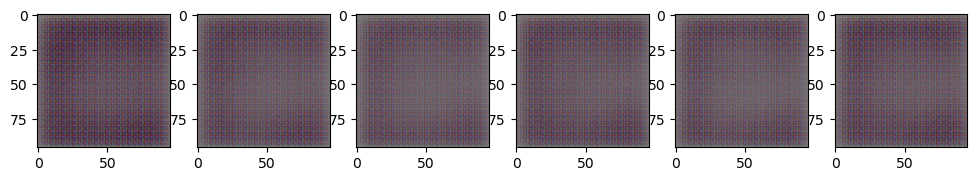

157/157 [==============================] - 55s 315ms/step - g_loss: 11.4889 - d_loss: 0.2199 - real_acc: 0.9853 - gen_acc: 0.9783
Epoch 2/250
157/157 [==============================] - 50s 319ms/step - g_loss: 9.8790 - d_loss: 0.2110 - real_acc: 0.9871 - gen_acc: 0.9934
Epoch 3/250
157/157 [==============================] - 51s 328ms/step - g_loss: 11.0957 - d_loss: 0.1894 - real_acc: 0.9929 - gen_acc: 0.9870
Epoch 4/250
157/157 [==============================] - 52s 332ms/step - g_loss: 10.3246 - d_loss: 0.1980 - real_acc: 0.9843 - gen_acc: 0.9940
Epoch 5/250
157/157 [==============================] - 56s 360ms/step - g_loss: 9.1526 - d_loss: 0.2012 - real_acc: 0.9848 - gen_acc: 0.9929
Epoch 6/250
157/157 [==============================] - 59s 376ms/step - g_loss: 9.7154 - d_loss: 0.1912 - real_acc: 0.9888 - gen_acc: 0.9945
Epoch 7/250
157/157 [==============================] - 60s 384ms/step - g_loss: 7.4631 - d_loss: 0.2038 - real_acc: 0.9836 - gen_acc: 0.9918
Epoch 8/250
157/157 [=

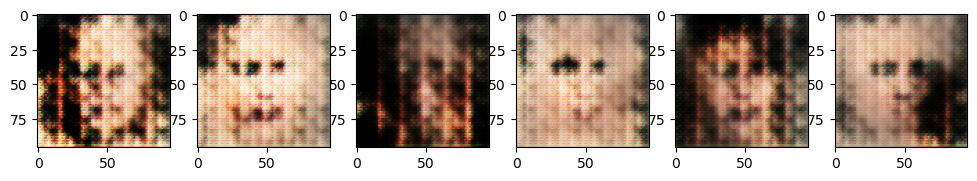

157/157 [==============================] - 66s 421ms/step - g_loss: 9.3840 - d_loss: 0.1810 - real_acc: 0.9944 - gen_acc: 0.9988
Epoch 12/250
157/157 [==============================] - 67s 424ms/step - g_loss: 8.7842 - d_loss: 0.1826 - real_acc: 0.9935 - gen_acc: 0.9999
Epoch 13/250
157/157 [==============================] - 66s 421ms/step - g_loss: 8.7290 - d_loss: 0.1823 - real_acc: 0.9929 - gen_acc: 1.0000
Epoch 14/250
157/157 [==============================] - 63s 403ms/step - g_loss: 8.3368 - d_loss: 0.1842 - real_acc: 0.9945 - gen_acc: 0.9985
Epoch 15/250
157/157 [==============================] - 63s 404ms/step - g_loss: 8.3837 - d_loss: 0.1831 - real_acc: 0.9933 - gen_acc: 1.0000
Epoch 16/250
157/157 [==============================] - 63s 401ms/step - g_loss: 7.8229 - d_loss: 0.1895 - real_acc: 0.9902 - gen_acc: 0.9980
Epoch 17/250
157/157 [==============================] - 63s 402ms/step - g_loss: 7.6812 - d_loss: 0.1870 - real_acc: 0.9931 - gen_acc: 1.0000
Epoch 18/250
157/15

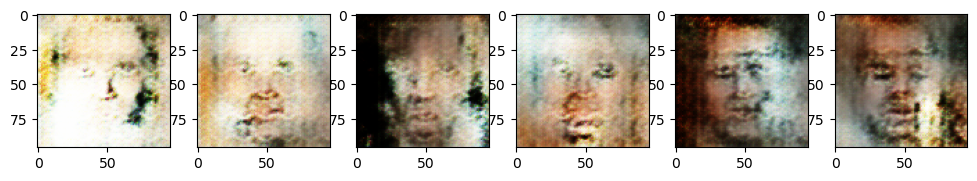

157/157 [==============================] - 72s 458ms/step - g_loss: 7.3392 - d_loss: 0.1945 - real_acc: 0.9855 - gen_acc: 0.9995
Epoch 22/250
157/157 [==============================] - 72s 462ms/step - g_loss: 7.2739 - d_loss: 0.1931 - real_acc: 0.9854 - gen_acc: 0.9998
Epoch 23/250
157/157 [==============================] - 64s 410ms/step - g_loss: 7.3513 - d_loss: 0.1941 - real_acc: 0.9859 - gen_acc: 0.9993
Epoch 24/250
157/157 [==============================] - 63s 401ms/step - g_loss: 7.2405 - d_loss: 0.1985 - real_acc: 0.9825 - gen_acc: 0.9990
Epoch 25/250
157/157 [==============================] - 64s 409ms/step - g_loss: 7.2466 - d_loss: 0.1979 - real_acc: 0.9827 - gen_acc: 0.9969
Epoch 26/250
157/157 [==============================] - 65s 414ms/step - g_loss: 7.1398 - d_loss: 0.1996 - real_acc: 0.9819 - gen_acc: 0.9991
Epoch 27/250
157/157 [==============================] - 66s 421ms/step - g_loss: 7.0655 - d_loss: 0.2016 - real_acc: 0.9785 - gen_acc: 0.9968
Epoch 28/250
157/15

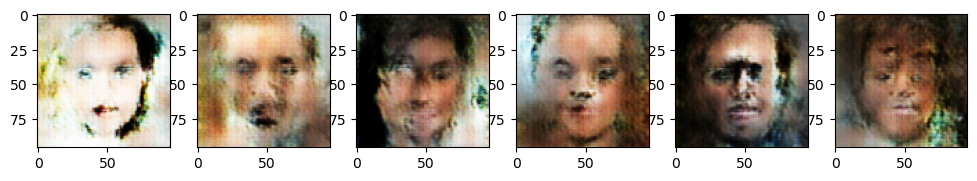

157/157 [==============================] - 64s 410ms/step - g_loss: 7.0748 - d_loss: 0.2045 - real_acc: 0.9769 - gen_acc: 0.9961
Epoch 32/250
157/157 [==============================] - 63s 404ms/step - g_loss: 6.9149 - d_loss: 0.2130 - real_acc: 0.9747 - gen_acc: 0.9912
Epoch 33/250
157/157 [==============================] - 64s 406ms/step - g_loss: 7.1033 - d_loss: 0.2029 - real_acc: 0.9799 - gen_acc: 0.9992
Epoch 34/250
157/157 [==============================] - 64s 407ms/step - g_loss: 7.0471 - d_loss: 0.2046 - real_acc: 0.9779 - gen_acc: 0.9976
Epoch 35/250
157/157 [==============================] - 64s 410ms/step - g_loss: 7.1156 - d_loss: 0.2058 - real_acc: 0.9766 - gen_acc: 0.9981
Epoch 36/250
157/157 [==============================] - 64s 409ms/step - g_loss: 6.9008 - d_loss: 0.2079 - real_acc: 0.9783 - gen_acc: 0.9976
Epoch 37/250
157/157 [==============================] - 63s 401ms/step - g_loss: 6.6784 - d_loss: 0.2116 - real_acc: 0.9738 - gen_acc: 0.9970
Epoch 38/250
157/15

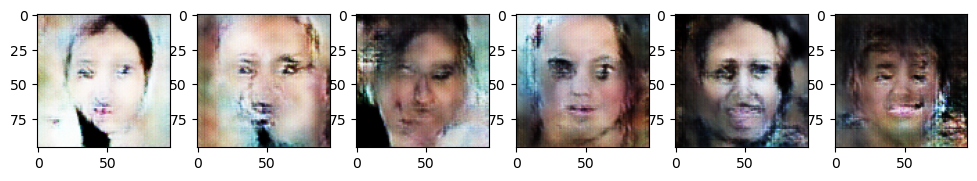

157/157 [==============================] - 65s 415ms/step - g_loss: 6.4089 - d_loss: 0.2154 - real_acc: 0.9714 - gen_acc: 0.9947
Epoch 42/250
157/157 [==============================] - 61s 391ms/step - g_loss: 6.3584 - d_loss: 0.2157 - real_acc: 0.9694 - gen_acc: 0.9968
Epoch 43/250
157/157 [==============================] - 61s 390ms/step - g_loss: 6.2937 - d_loss: 0.2213 - real_acc: 0.9653 - gen_acc: 0.9948
Epoch 44/250
157/157 [==============================] - 64s 405ms/step - g_loss: 6.1138 - d_loss: 0.2241 - real_acc: 0.9611 - gen_acc: 0.9933
Epoch 45/250
157/157 [==============================] - 64s 405ms/step - g_loss: 6.2075 - d_loss: 0.2215 - real_acc: 0.9619 - gen_acc: 0.9954
Epoch 46/250
157/157 [==============================] - 64s 410ms/step - g_loss: 6.1650 - d_loss: 0.2197 - real_acc: 0.9638 - gen_acc: 0.9969
Epoch 47/250
157/157 [==============================] - 64s 408ms/step - g_loss: 6.2159 - d_loss: 0.2219 - real_acc: 0.9654 - gen_acc: 0.9946
Epoch 48/250
157/15

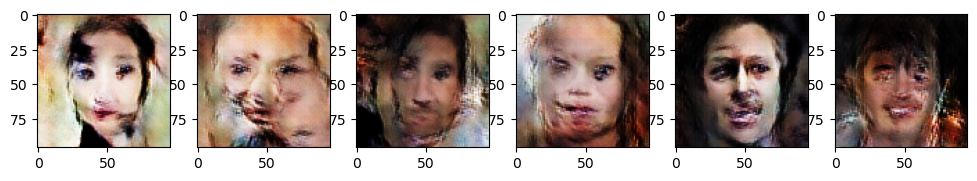

157/157 [==============================] - 66s 418ms/step - g_loss: 6.0565 - d_loss: 0.2241 - real_acc: 0.9619 - gen_acc: 0.9945
Epoch 52/250
157/157 [==============================] - 65s 414ms/step - g_loss: 5.9639 - d_loss: 0.2298 - real_acc: 0.9581 - gen_acc: 0.9907
Epoch 53/250
157/157 [==============================] - 64s 410ms/step - g_loss: 5.8537 - d_loss: 0.2281 - real_acc: 0.9566 - gen_acc: 0.9914
Epoch 54/250
157/157 [==============================] - 64s 408ms/step - g_loss: 5.9136 - d_loss: 0.2251 - real_acc: 0.9605 - gen_acc: 0.9947
Epoch 55/250
157/157 [==============================] - 64s 408ms/step - g_loss: 5.7674 - d_loss: 0.2276 - real_acc: 0.9596 - gen_acc: 0.9939
Epoch 56/250
157/157 [==============================] - 65s 411ms/step - g_loss: 5.8306 - d_loss: 0.2252 - real_acc: 0.9608 - gen_acc: 0.9955
Epoch 57/250
157/157 [==============================] - 65s 417ms/step - g_loss: 5.7941 - d_loss: 0.2324 - real_acc: 0.9556 - gen_acc: 0.9926
Epoch 58/250
157/15

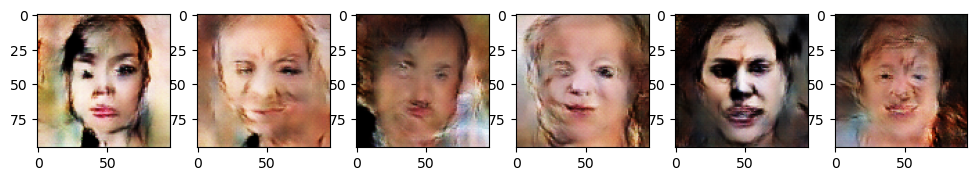

157/157 [==============================] - 63s 399ms/step - g_loss: 5.5928 - d_loss: 0.2320 - real_acc: 0.9551 - gen_acc: 0.9944
Epoch 62/250
157/157 [==============================] - 62s 392ms/step - g_loss: 5.5513 - d_loss: 0.2318 - real_acc: 0.9572 - gen_acc: 0.9939
Epoch 63/250
157/157 [==============================] - 65s 411ms/step - g_loss: 5.7135 - d_loss: 0.2260 - real_acc: 0.9613 - gen_acc: 0.9949
Epoch 64/250
157/157 [==============================] - 64s 409ms/step - g_loss: 5.6414 - d_loss: 0.2305 - real_acc: 0.9549 - gen_acc: 0.9943
Epoch 65/250
157/157 [==============================] - 65s 415ms/step - g_loss: 5.6399 - d_loss: 0.2313 - real_acc: 0.9578 - gen_acc: 0.9909
Epoch 66/250
157/157 [==============================] - 66s 419ms/step - g_loss: 5.5662 - d_loss: 0.2288 - real_acc: 0.9566 - gen_acc: 0.9940
Epoch 67/250
157/157 [==============================] - 63s 401ms/step - g_loss: 5.5263 - d_loss: 0.2336 - real_acc: 0.9542 - gen_acc: 0.9924
Epoch 68/250
157/15

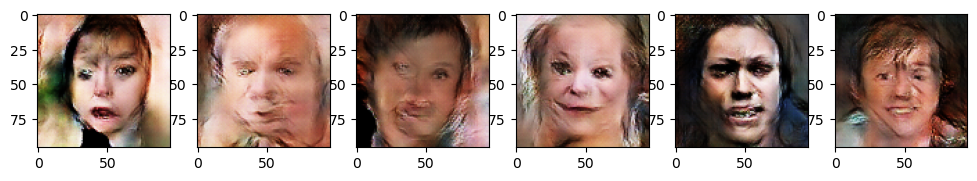

157/157 [==============================] - 63s 399ms/step - g_loss: 5.4988 - d_loss: 0.2312 - real_acc: 0.9560 - gen_acc: 0.9925
Epoch 72/250
157/157 [==============================] - 61s 386ms/step - g_loss: 5.4665 - d_loss: 0.2332 - real_acc: 0.9530 - gen_acc: 0.9925
Epoch 73/250
157/157 [==============================] - 61s 391ms/step - g_loss: 5.5075 - d_loss: 0.2365 - real_acc: 0.9551 - gen_acc: 0.9897
Epoch 74/250
157/157 [==============================] - 63s 404ms/step - g_loss: 5.4248 - d_loss: 0.2312 - real_acc: 0.9561 - gen_acc: 0.9939
Epoch 75/250
157/157 [==============================] - 61s 392ms/step - g_loss: 5.4539 - d_loss: 0.2304 - real_acc: 0.9579 - gen_acc: 0.9929
Epoch 76/250
157/157 [==============================] - 60s 382ms/step - g_loss: 5.4802 - d_loss: 0.2285 - real_acc: 0.9573 - gen_acc: 0.9951
Epoch 77/250
157/157 [==============================] - 60s 380ms/step - g_loss: 5.4049 - d_loss: 0.2329 - real_acc: 0.9562 - gen_acc: 0.9932
Epoch 78/250
157/15

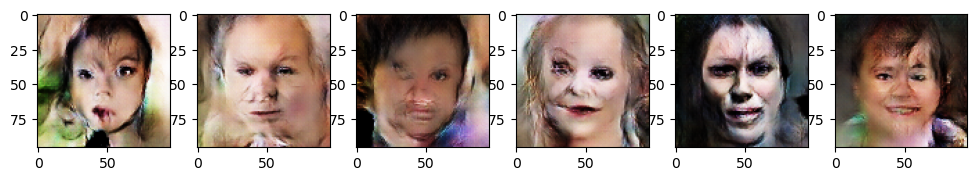

157/157 [==============================] - 62s 392ms/step - g_loss: 5.3531 - d_loss: 0.2333 - real_acc: 0.9552 - gen_acc: 0.9933
Epoch 82/250
157/157 [==============================] - 63s 403ms/step - g_loss: 5.2915 - d_loss: 0.2327 - real_acc: 0.9539 - gen_acc: 0.9923
Epoch 83/250
157/157 [==============================] - 63s 402ms/step - g_loss: 5.3291 - d_loss: 0.2305 - real_acc: 0.9554 - gen_acc: 0.9942
Epoch 84/250
157/157 [==============================] - 62s 395ms/step - g_loss: 5.3511 - d_loss: 0.2359 - real_acc: 0.9516 - gen_acc: 0.9911
Epoch 85/250
157/157 [==============================] - 66s 420ms/step - g_loss: 5.3243 - d_loss: 0.2348 - real_acc: 0.9534 - gen_acc: 0.9913
Epoch 86/250
157/157 [==============================] - 61s 388ms/step - g_loss: 5.2648 - d_loss: 0.2322 - real_acc: 0.9550 - gen_acc: 0.9947
Epoch 87/250
157/157 [==============================] - 60s 383ms/step - g_loss: 5.3199 - d_loss: 0.2317 - real_acc: 0.9549 - gen_acc: 0.9931
Epoch 88/250
157/15

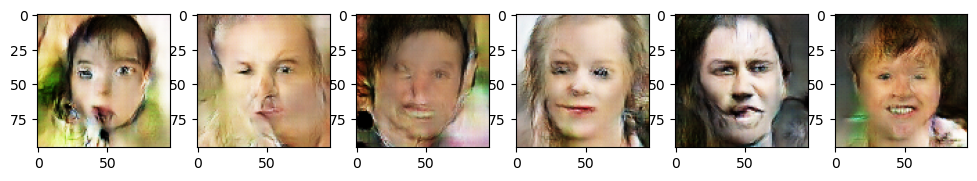

157/157 [==============================] - 63s 402ms/step - g_loss: 5.1411 - d_loss: 0.2367 - real_acc: 0.9504 - gen_acc: 0.9930
Epoch 92/250
157/157 [==============================] - 60s 385ms/step - g_loss: 5.1640 - d_loss: 0.2294 - real_acc: 0.9595 - gen_acc: 0.9945
Epoch 93/250
157/157 [==============================] - 59s 379ms/step - g_loss: 5.1990 - d_loss: 0.2398 - real_acc: 0.9518 - gen_acc: 0.9904
Epoch 94/250
157/157 [==============================] - 60s 379ms/step - g_loss: 5.1684 - d_loss: 0.2324 - real_acc: 0.9547 - gen_acc: 0.9940
Epoch 95/250
157/157 [==============================] - 59s 378ms/step - g_loss: 5.1769 - d_loss: 0.2302 - real_acc: 0.9586 - gen_acc: 0.9953
Epoch 96/250
157/157 [==============================] - 61s 389ms/step - g_loss: 5.1676 - d_loss: 0.2319 - real_acc: 0.9570 - gen_acc: 0.9925
Epoch 97/250
157/157 [==============================] - 63s 404ms/step - g_loss: 5.1631 - d_loss: 0.2338 - real_acc: 0.9528 - gen_acc: 0.9947
Epoch 98/250
157/15

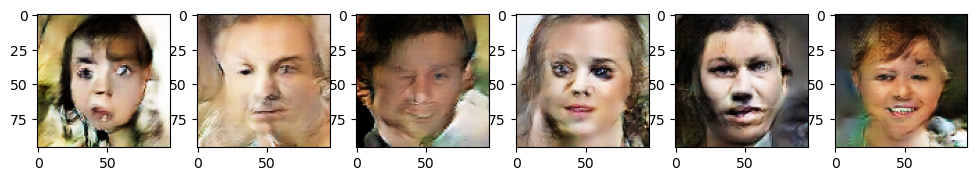

157/157 [==============================] - 64s 408ms/step - g_loss: 5.0527 - d_loss: 0.2336 - real_acc: 0.9527 - gen_acc: 0.9940
Epoch 102/250
157/157 [==============================] - 61s 391ms/step - g_loss: 5.1351 - d_loss: 0.2317 - real_acc: 0.9558 - gen_acc: 0.9932
Epoch 103/250
157/157 [==============================] - 61s 392ms/step - g_loss: 5.0885 - d_loss: 0.2317 - real_acc: 0.9557 - gen_acc: 0.9942
Epoch 104/250
157/157 [==============================] - 60s 383ms/step - g_loss: 5.0768 - d_loss: 0.2307 - real_acc: 0.9570 - gen_acc: 0.9944
Epoch 105/250
157/157 [==============================] - 61s 387ms/step - g_loss: 5.0499 - d_loss: 0.2296 - real_acc: 0.9578 - gen_acc: 0.9949
Epoch 106/250
157/157 [==============================] - 63s 401ms/step - g_loss: 5.0629 - d_loss: 0.2310 - real_acc: 0.9566 - gen_acc: 0.9952
Epoch 107/250
157/157 [==============================] - 63s 401ms/step - g_loss: 5.0849 - d_loss: 0.2339 - real_acc: 0.9553 - gen_acc: 0.9922
Epoch 108/250

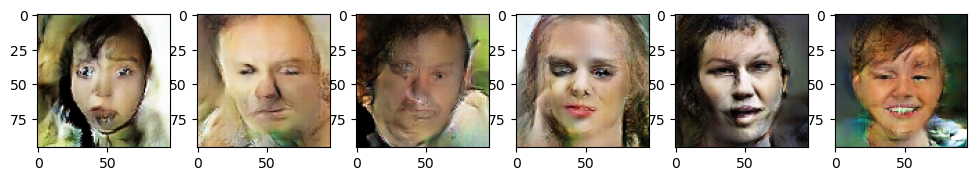

157/157 [==============================] - 64s 405ms/step - g_loss: 5.0906 - d_loss: 0.2318 - real_acc: 0.9551 - gen_acc: 0.9929
Epoch 112/250
157/157 [==============================] - 62s 398ms/step - g_loss: 5.0210 - d_loss: 0.2290 - real_acc: 0.9582 - gen_acc: 0.9955
Epoch 113/250
157/157 [==============================] - 64s 406ms/step - g_loss: 5.0569 - d_loss: 0.2325 - real_acc: 0.9569 - gen_acc: 0.9934
Epoch 114/250
157/157 [==============================] - 65s 411ms/step - g_loss: 5.0897 - d_loss: 0.2323 - real_acc: 0.9545 - gen_acc: 0.9953
Epoch 115/250
157/157 [==============================] - 64s 410ms/step - g_loss: 5.0233 - d_loss: 0.2300 - real_acc: 0.9581 - gen_acc: 0.9941
Epoch 116/250
157/157 [==============================] - 63s 401ms/step - g_loss: 5.0055 - d_loss: 0.2290 - real_acc: 0.9567 - gen_acc: 0.9959
Epoch 117/250
157/157 [==============================] - 62s 393ms/step - g_loss: 5.0394 - d_loss: 0.2299 - real_acc: 0.9590 - gen_acc: 0.9955
Epoch 118/250

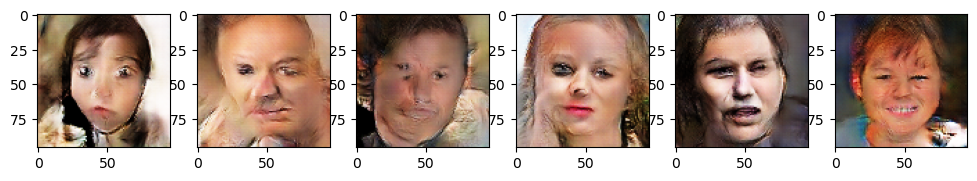

157/157 [==============================] - 61s 389ms/step - g_loss: 5.0424 - d_loss: 0.2269 - real_acc: 0.9607 - gen_acc: 0.9960
Epoch 122/250
157/157 [==============================] - 61s 391ms/step - g_loss: 4.9726 - d_loss: 0.2281 - real_acc: 0.9602 - gen_acc: 0.9962
Epoch 123/250
157/157 [==============================] - 65s 415ms/step - g_loss: 4.9960 - d_loss: 0.2301 - real_acc: 0.9591 - gen_acc: 0.9960
Epoch 124/250
157/157 [==============================] - 62s 397ms/step - g_loss: 5.0273 - d_loss: 0.2275 - real_acc: 0.9591 - gen_acc: 0.9953
Epoch 125/250
157/157 [==============================] - 62s 398ms/step - g_loss: 4.9868 - d_loss: 0.2290 - real_acc: 0.9572 - gen_acc: 0.9956
Epoch 126/250
157/157 [==============================] - 61s 391ms/step - g_loss: 5.0466 - d_loss: 0.2287 - real_acc: 0.9603 - gen_acc: 0.9954
Epoch 127/250
157/157 [==============================] - 62s 396ms/step - g_loss: 5.0080 - d_loss: 0.2291 - real_acc: 0.9594 - gen_acc: 0.9966
Epoch 128/250

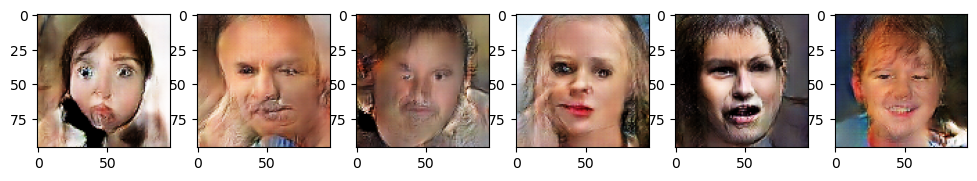

157/157 [==============================] - 62s 398ms/step - g_loss: 5.0040 - d_loss: 0.2258 - real_acc: 0.9618 - gen_acc: 0.9960
Epoch 132/250
157/157 [==============================] - 62s 394ms/step - g_loss: 5.0197 - d_loss: 0.2274 - real_acc: 0.9628 - gen_acc: 0.9952
Epoch 133/250
157/157 [==============================] - 61s 390ms/step - g_loss: 4.9619 - d_loss: 0.2275 - real_acc: 0.9602 - gen_acc: 0.9950
Epoch 134/250
157/157 [==============================] - 63s 398ms/step - g_loss: 4.9674 - d_loss: 0.2259 - real_acc: 0.9596 - gen_acc: 0.9958
Epoch 135/250
157/157 [==============================] - 63s 400ms/step - g_loss: 5.0075 - d_loss: 0.2284 - real_acc: 0.9614 - gen_acc: 0.9941
Epoch 136/250
157/157 [==============================] - 65s 417ms/step - g_loss: 4.9952 - d_loss: 0.2251 - real_acc: 0.9645 - gen_acc: 0.9958
Epoch 137/250
157/157 [==============================] - 63s 400ms/step - g_loss: 4.9895 - d_loss: 0.2270 - real_acc: 0.9620 - gen_acc: 0.9961
Epoch 138/250

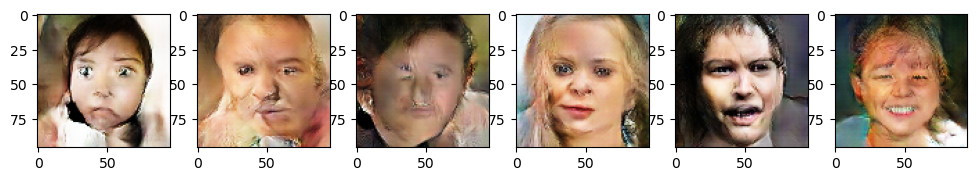

157/157 [==============================] - 65s 412ms/step - g_loss: 4.9948 - d_loss: 0.2237 - real_acc: 0.9654 - gen_acc: 0.9971
Epoch 142/250
157/157 [==============================] - 64s 405ms/step - g_loss: 5.0046 - d_loss: 0.2263 - real_acc: 0.9622 - gen_acc: 0.9938
Epoch 143/250
157/157 [==============================] - 62s 395ms/step - g_loss: 5.0320 - d_loss: 0.2228 - real_acc: 0.9671 - gen_acc: 0.9967
Epoch 144/250
157/157 [==============================] - 65s 411ms/step - g_loss: 4.9582 - d_loss: 0.2274 - real_acc: 0.9622 - gen_acc: 0.9946
Epoch 145/250
157/157 [==============================] - 63s 404ms/step - g_loss: 5.0008 - d_loss: 0.2201 - real_acc: 0.9684 - gen_acc: 0.9974
Epoch 146/250
157/157 [==============================] - 64s 405ms/step - g_loss: 4.9779 - d_loss: 0.2241 - real_acc: 0.9676 - gen_acc: 0.9959
Epoch 147/250
157/157 [==============================] - 64s 409ms/step - g_loss: 5.0294 - d_loss: 0.2228 - real_acc: 0.9671 - gen_acc: 0.9958
Epoch 148/250

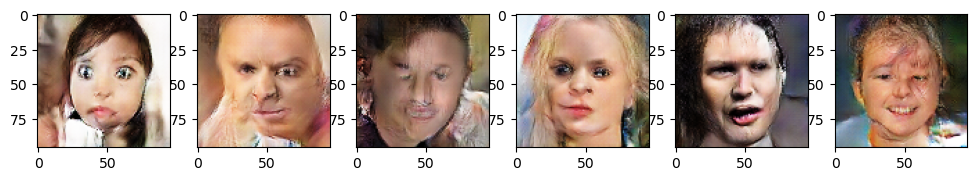

157/157 [==============================] - 63s 403ms/step - g_loss: 4.9635 - d_loss: 0.2224 - real_acc: 0.9667 - gen_acc: 0.9970
Epoch 152/250
157/157 [==============================] - 62s 395ms/step - g_loss: 5.0198 - d_loss: 0.2223 - real_acc: 0.9644 - gen_acc: 0.9970
Epoch 153/250
157/157 [==============================] - 63s 403ms/step - g_loss: 5.0458 - d_loss: 0.2219 - real_acc: 0.9701 - gen_acc: 0.9959
Epoch 154/250
157/157 [==============================] - 62s 394ms/step - g_loss: 4.9799 - d_loss: 0.2213 - real_acc: 0.9659 - gen_acc: 0.9970
Epoch 155/250
157/157 [==============================] - 64s 407ms/step - g_loss: 4.9776 - d_loss: 0.2219 - real_acc: 0.9664 - gen_acc: 0.9972
Epoch 156/250
157/157 [==============================] - 60s 383ms/step - g_loss: 4.9693 - d_loss: 0.2232 - real_acc: 0.9644 - gen_acc: 0.9961
Epoch 157/250
157/157 [==============================] - 60s 384ms/step - g_loss: 4.9790 - d_loss: 0.2210 - real_acc: 0.9645 - gen_acc: 0.9972
Epoch 158/250

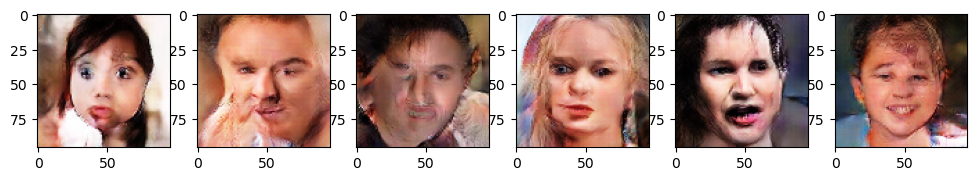

157/157 [==============================] - 64s 407ms/step - g_loss: 4.9889 - d_loss: 0.2207 - real_acc: 0.9653 - gen_acc: 0.9971
Epoch 162/250
157/157 [==============================] - 64s 406ms/step - g_loss: 5.0022 - d_loss: 0.2197 - real_acc: 0.9689 - gen_acc: 0.9975
Epoch 163/250
157/157 [==============================] - 64s 410ms/step - g_loss: 5.0283 - d_loss: 0.2196 - real_acc: 0.9693 - gen_acc: 0.9976
Epoch 164/250
157/157 [==============================] - 66s 423ms/step - g_loss: 5.0280 - d_loss: 0.2177 - real_acc: 0.9711 - gen_acc: 0.9974
Epoch 165/250
157/157 [==============================] - 64s 410ms/step - g_loss: 5.0495 - d_loss: 0.2193 - real_acc: 0.9695 - gen_acc: 0.9967
Epoch 166/250
157/157 [==============================] - 63s 404ms/step - g_loss: 4.9925 - d_loss: 0.2175 - real_acc: 0.9694 - gen_acc: 0.9974
Epoch 167/250
157/157 [==============================] - 64s 407ms/step - g_loss: 5.0136 - d_loss: 0.2175 - real_acc: 0.9706 - gen_acc: 0.9982
Epoch 168/250

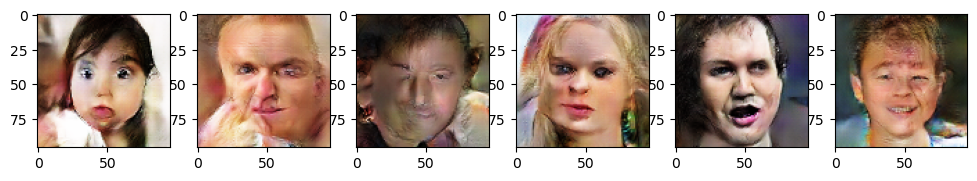

157/157 [==============================] - 65s 413ms/step - g_loss: 4.9984 - d_loss: 0.2169 - real_acc: 0.9708 - gen_acc: 0.9978
Epoch 172/250
157/157 [==============================] - 63s 399ms/step - g_loss: 5.0122 - d_loss: 0.2167 - real_acc: 0.9724 - gen_acc: 0.9976
Epoch 173/250
157/157 [==============================] - 61s 389ms/step - g_loss: 5.0001 - d_loss: 0.2167 - real_acc: 0.9713 - gen_acc: 0.9979
Epoch 174/250
157/157 [==============================] - 64s 408ms/step - g_loss: 5.0338 - d_loss: 0.2159 - real_acc: 0.9717 - gen_acc: 0.9973
Epoch 175/250
157/157 [==============================] - 71s 450ms/step - g_loss: 4.9926 - d_loss: 0.2157 - real_acc: 0.9727 - gen_acc: 0.9975
Epoch 176/250
157/157 [==============================] - 72s 461ms/step - g_loss: 4.9828 - d_loss: 0.2160 - real_acc: 0.9701 - gen_acc: 0.9973
Epoch 177/250
157/157 [==============================] - 69s 442ms/step - g_loss: 5.0241 - d_loss: 0.2145 - real_acc: 0.9716 - gen_acc: 0.9988
Epoch 178/250

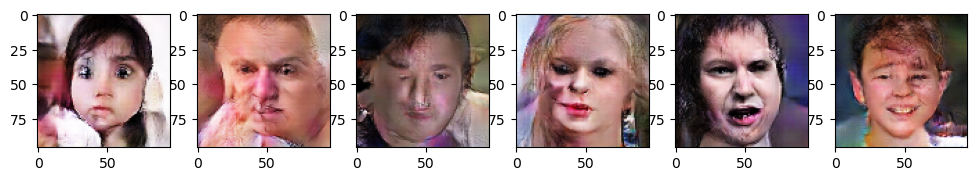

157/157 [==============================] - 64s 407ms/step - g_loss: 5.0334 - d_loss: 0.2145 - real_acc: 0.9724 - gen_acc: 0.9984
Epoch 182/250
157/157 [==============================] - 63s 403ms/step - g_loss: 5.0728 - d_loss: 0.2136 - real_acc: 0.9751 - gen_acc: 0.9981
Epoch 183/250
157/157 [==============================] - 64s 407ms/step - g_loss: 5.0277 - d_loss: 0.2136 - real_acc: 0.9744 - gen_acc: 0.9984
Epoch 184/250
157/157 [==============================] - 63s 403ms/step - g_loss: 5.0194 - d_loss: 0.2126 - real_acc: 0.9757 - gen_acc: 0.9982
Epoch 185/250
157/157 [==============================] - 65s 413ms/step - g_loss: 5.0313 - d_loss: 0.2143 - real_acc: 0.9744 - gen_acc: 0.9984
Epoch 186/250
157/157 [==============================] - 67s 424ms/step - g_loss: 5.0248 - d_loss: 0.2156 - real_acc: 0.9707 - gen_acc: 0.9979
Epoch 187/250
157/157 [==============================] - 63s 404ms/step - g_loss: 5.0445 - d_loss: 0.2135 - real_acc: 0.9756 - gen_acc: 0.9974
Epoch 188/250

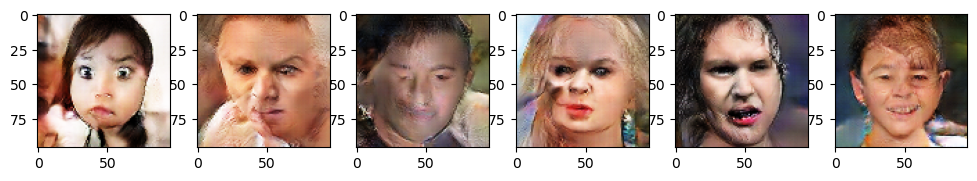

157/157 [==============================] - 61s 386ms/step - g_loss: 5.0473 - d_loss: 0.2122 - real_acc: 0.9759 - gen_acc: 0.9983
Epoch 192/250
157/157 [==============================] - 65s 412ms/step - g_loss: 5.0203 - d_loss: 0.2123 - real_acc: 0.9757 - gen_acc: 0.9985
Epoch 193/250
157/157 [==============================] - 70s 446ms/step - g_loss: 5.0107 - d_loss: 0.2115 - real_acc: 0.9760 - gen_acc: 0.9989
Epoch 194/250
157/157 [==============================] - 72s 457ms/step - g_loss: 5.0364 - d_loss: 0.2129 - real_acc: 0.9745 - gen_acc: 0.9980
Epoch 195/250
157/157 [==============================] - 73s 462ms/step - g_loss: 5.0816 - d_loss: 0.2115 - real_acc: 0.9768 - gen_acc: 0.9986
Epoch 196/250
157/157 [==============================] - 71s 455ms/step - g_loss: 5.0544 - d_loss: 0.2102 - real_acc: 0.9781 - gen_acc: 0.9984
Epoch 197/250
157/157 [==============================] - 70s 445ms/step - g_loss: 5.1031 - d_loss: 0.2102 - real_acc: 0.9774 - gen_acc: 0.9987
Epoch 198/250

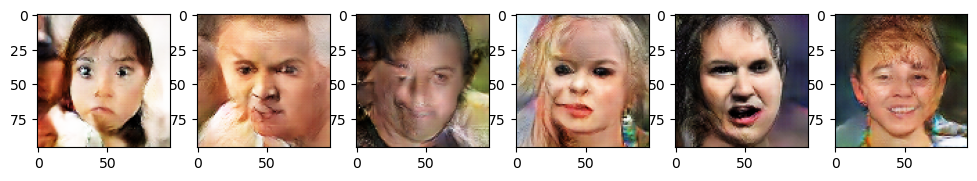

157/157 [==============================] - 65s 417ms/step - g_loss: 5.0823 - d_loss: 0.2121 - real_acc: 0.9766 - gen_acc: 0.9979
Epoch 202/250
157/157 [==============================] - 65s 414ms/step - g_loss: 5.0676 - d_loss: 0.2097 - real_acc: 0.9750 - gen_acc: 0.9990
Epoch 203/250
157/157 [==============================] - 66s 417ms/step - g_loss: 5.0526 - d_loss: 0.2093 - real_acc: 0.9780 - gen_acc: 0.9988
Epoch 204/250
157/157 [==============================] - 62s 392ms/step - g_loss: 5.0971 - d_loss: 0.2114 - real_acc: 0.9756 - gen_acc: 0.9987
Epoch 205/250
157/157 [==============================] - 61s 390ms/step - g_loss: 5.0586 - d_loss: 0.2121 - real_acc: 0.9745 - gen_acc: 0.9974
Epoch 206/250
157/157 [==============================] - 61s 389ms/step - g_loss: 5.0690 - d_loss: 0.2094 - real_acc: 0.9792 - gen_acc: 0.9975
Epoch 207/250
157/157 [==============================] - 61s 388ms/step - g_loss: 5.0508 - d_loss: 0.2080 - real_acc: 0.9812 - gen_acc: 0.9994
Epoch 208/250

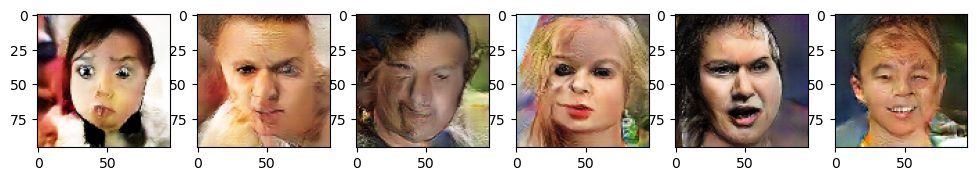

157/157 [==============================] - 64s 410ms/step - g_loss: 5.0619 - d_loss: 0.2085 - real_acc: 0.9791 - gen_acc: 0.9990
Epoch 212/250
157/157 [==============================] - 64s 408ms/step - g_loss: 5.0824 - d_loss: 0.2080 - real_acc: 0.9807 - gen_acc: 0.9986
Epoch 213/250
157/157 [==============================] - 63s 399ms/step - g_loss: 5.0879 - d_loss: 0.2079 - real_acc: 0.9795 - gen_acc: 0.9989
Epoch 214/250
157/157 [==============================] - 62s 395ms/step - g_loss: 5.0842 - d_loss: 0.2076 - real_acc: 0.9798 - gen_acc: 0.9987
Epoch 215/250
157/157 [==============================] - 62s 394ms/step - g_loss: 5.1352 - d_loss: 0.2077 - real_acc: 0.9798 - gen_acc: 0.9979
Epoch 216/250
157/157 [==============================] - 62s 397ms/step - g_loss: 5.1229 - d_loss: 0.2083 - real_acc: 0.9784 - gen_acc: 0.9988
Epoch 217/250
157/157 [==============================] - 61s 385ms/step - g_loss: 5.0795 - d_loss: 0.2067 - real_acc: 0.9809 - gen_acc: 0.9990
Epoch 218/250

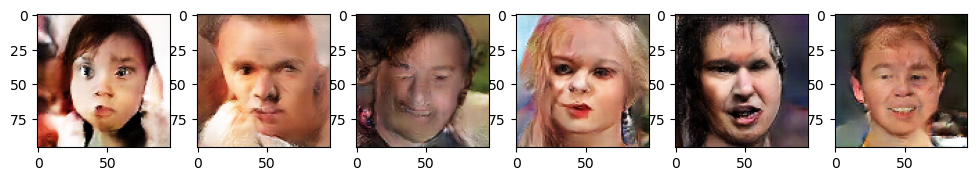

157/157 [==============================] - 57s 365ms/step - g_loss: 5.1212 - d_loss: 0.2068 - real_acc: 0.9806 - gen_acc: 0.9991
Epoch 222/250
157/157 [==============================] - 57s 364ms/step - g_loss: 5.0970 - d_loss: 0.2065 - real_acc: 0.9806 - gen_acc: 0.9984
Epoch 223/250
157/157 [==============================] - 63s 403ms/step - g_loss: 5.1081 - d_loss: 0.2054 - real_acc: 0.9810 - gen_acc: 0.9989
Epoch 224/250
157/157 [==============================] - 67s 424ms/step - g_loss: 5.0826 - d_loss: 0.2069 - real_acc: 0.9805 - gen_acc: 0.9984
Epoch 225/250
157/157 [==============================] - 66s 418ms/step - g_loss: 5.1130 - d_loss: 0.2060 - real_acc: 0.9807 - gen_acc: 0.9988
Epoch 226/250
157/157 [==============================] - 62s 396ms/step - g_loss: 5.1122 - d_loss: 0.2050 - real_acc: 0.9820 - gen_acc: 0.9992
Epoch 227/250
157/157 [==============================] - 62s 393ms/step - g_loss: 5.1179 - d_loss: 0.2051 - real_acc: 0.9842 - gen_acc: 0.9989
Epoch 228/250

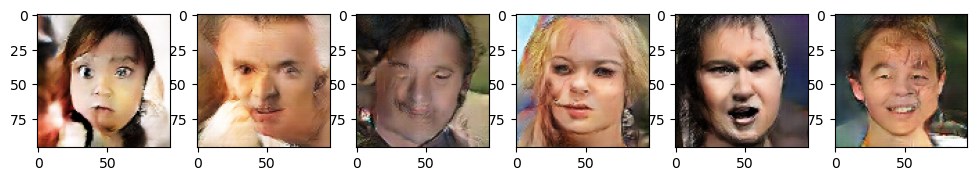

157/157 [==============================] - 61s 392ms/step - g_loss: 5.1504 - d_loss: 0.2043 - real_acc: 0.9833 - gen_acc: 0.9992
Epoch 232/250
157/157 [==============================] - 61s 391ms/step - g_loss: 5.1165 - d_loss: 0.2054 - real_acc: 0.9823 - gen_acc: 0.9985
Epoch 233/250
157/157 [==============================] - 62s 395ms/step - g_loss: 5.1247 - d_loss: 0.2040 - real_acc: 0.9820 - gen_acc: 0.9990
Epoch 234/250
157/157 [==============================] - 64s 409ms/step - g_loss: 5.1294 - d_loss: 0.2038 - real_acc: 0.9847 - gen_acc: 0.9992
Epoch 235/250
157/157 [==============================] - 67s 426ms/step - g_loss: 5.1276 - d_loss: 0.2036 - real_acc: 0.9822 - gen_acc: 0.9996
Epoch 236/250
157/157 [==============================] - 63s 402ms/step - g_loss: 5.1429 - d_loss: 0.2060 - real_acc: 0.9820 - gen_acc: 0.9974
Epoch 237/250
157/157 [==============================] - 64s 406ms/step - g_loss: 5.1711 - d_loss: 0.2034 - real_acc: 0.9858 - gen_acc: 0.9990
Epoch 238/250

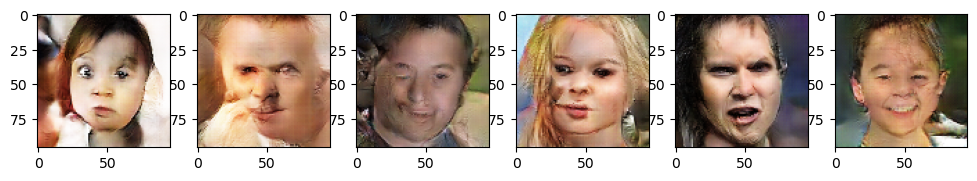

157/157 [==============================] - 61s 389ms/step - g_loss: 5.1425 - d_loss: 0.2052 - real_acc: 0.9804 - gen_acc: 0.9987
Epoch 242/250
157/157 [==============================] - 61s 389ms/step - g_loss: 5.1559 - d_loss: 0.2060 - real_acc: 0.9808 - gen_acc: 0.9974
Epoch 243/250
157/157 [==============================] - 63s 400ms/step - g_loss: 5.1792 - d_loss: 0.2008 - real_acc: 0.9859 - gen_acc: 0.9996
Epoch 244/250
157/157 [==============================] - 64s 409ms/step - g_loss: 5.1130 - d_loss: 0.2029 - real_acc: 0.9816 - gen_acc: 0.9993
Epoch 245/250
157/157 [==============================] - 60s 382ms/step - g_loss: 5.1730 - d_loss: 0.2027 - real_acc: 0.9837 - gen_acc: 0.9993
Epoch 246/250
157/157 [==============================] - 62s 397ms/step - g_loss: 5.1241 - d_loss: 0.2044 - real_acc: 0.9815 - gen_acc: 0.9992
Epoch 247/250
157/157 [==============================] - 63s 402ms/step - g_loss: 5.1307 - d_loss: 0.2029 - real_acc: 0.9839 - gen_acc: 0.9990
Epoch 248/250

In [32]:
history = gan.fit(train_dataset,
        epochs=250,
        callbacks=[ImageProgress(LATENT_DIM)]) 

In [33]:
g_loss, d_loss, real_acc, fake_acc = history.history.values()

In [34]:
generator.save_weights("generator_faces.h5")
discriminator.save_weights("discriminator_faces.h5")

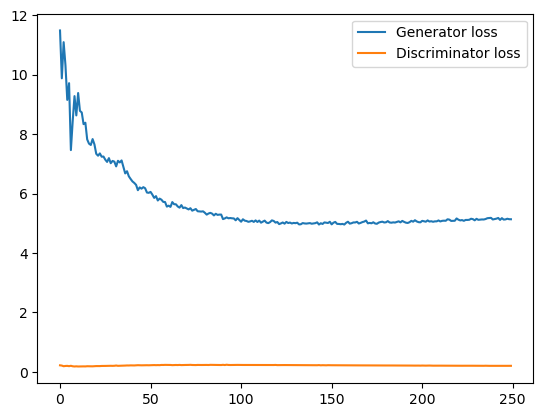

In [35]:
plt.plot(g_loss)
plt.plot(d_loss)
plt.legend(['Generator loss','Discriminator loss'])
plt.show()

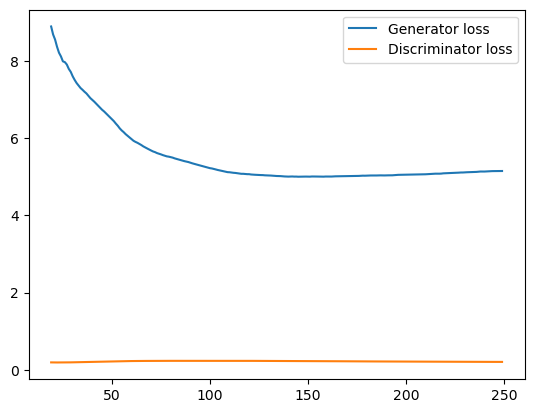

In [36]:
# Lets take a look at the smoothed plot (Simple Moving Average)

window_size = 20
# Convert array of integers to pandas series
d_sma_loss = pd.Series(d_loss)
g_sma_loss = pd.Series(g_loss)
  
# Get the window of series of observations of the specified window size
d_sma_loss = d_sma_loss.rolling(window_size).mean()
g_sma_loss = g_sma_loss.rolling(window_size).mean()

# Convert pandas series back to list
d_sma_loss = d_sma_loss.tolist()
g_sma_loss = g_sma_loss.tolist()

plt.plot(g_sma_loss)
plt.plot(d_sma_loss)
plt.legend(['Generator loss','Discriminator loss'])
plt.show()

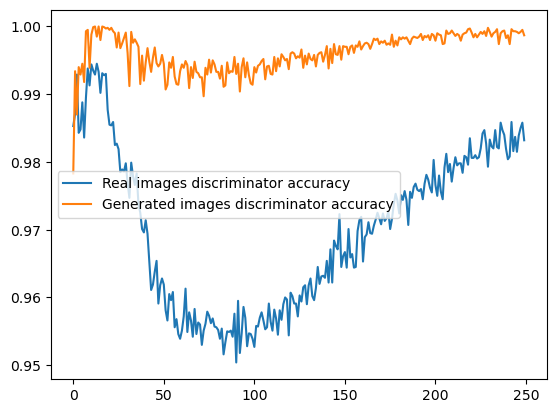

In [37]:
plt.plot(real_acc)
plt.plot(fake_acc)
plt.legend(['Real images discriminator accuracy','Generated images discriminator accuracy'])
plt.show()

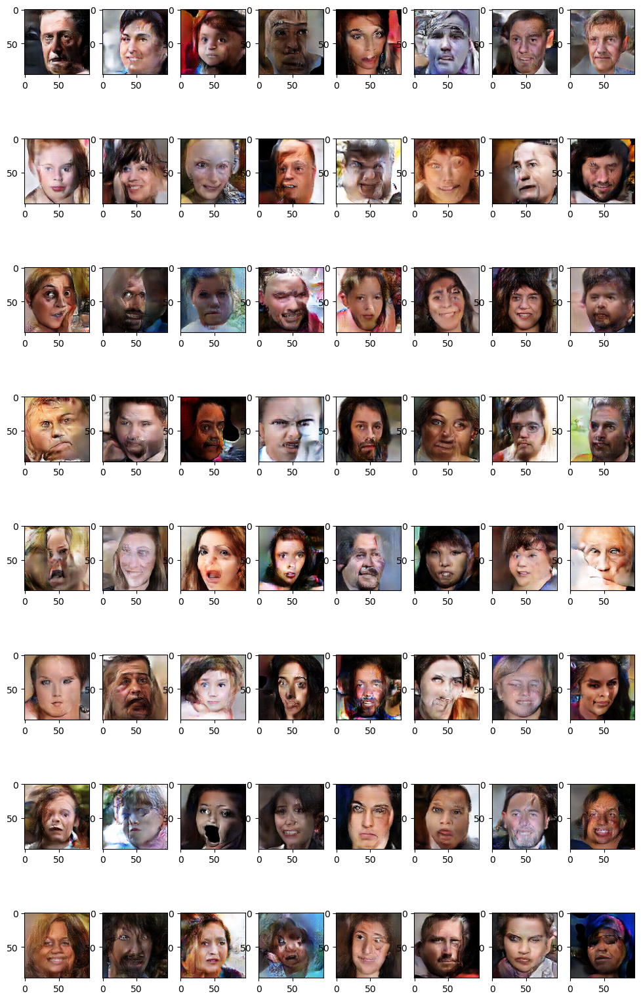

In [38]:
noise = tf.random.normal((64,LATENT_DIM))
generated = generator(noise,training=False)
fig = plt.figure(figsize=(12,20))
for i in range(8):
  for j in range(8):
    fig.add_subplot(8,8,i*8+j+1)
    plt.imshow((generated[i*8+j]+1)*0.5)
plt.show()

In [40]:
# 1. averaging two vectors
examples = 6
noise_1 = np.random.normal(size=(examples,LATENT_DIM))
noise_2 = np.random.normal(size=(examples,LATENT_DIM))
merged = (noise_1 + noise_2)/2 #mean

imgs_1 = generator(noise_1,training=False)
imgs_2 = generator(noise_2,training=False)
result = generator(merged,training=False)

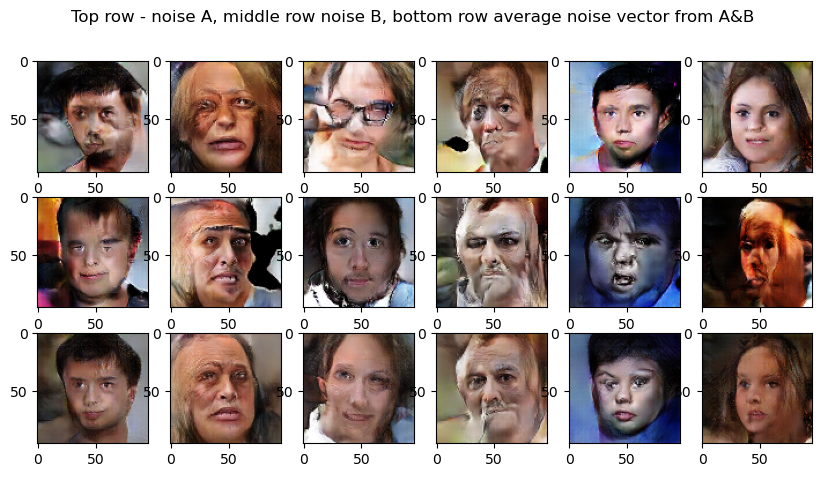

In [41]:
fig = plt.figure(figsize=(10,5))
for i, (a,b,c) in enumerate(zip(imgs_1,imgs_2,result)):
    fig.add_subplot(3,examples,1+i)
    plt.imshow((a+1)*0.5)
    fig.add_subplot(3,examples,examples+i+1)
    plt.imshow((b+1)*0.5)
    fig.add_subplot(3,examples,2*examples+i+1)
    plt.imshow((c+1)*0.5)

fig.suptitle("Top row - noise A, middle row noise B, bottom row average noise vector from A&B")
plt.show()

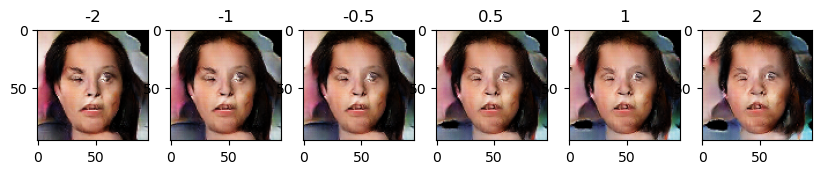

In [42]:
# Feature manipulation (changing single value in the original noise vector) 
noise = np.random.normal(size=(1,LATENT_DIM))
vals = [-2,-1,-0.5,0.5,1,2]                  # values to check
feature = 55                                 # from [0,LATENT_DIM-1]

def plot_feature_change(values,feature,noise):
    fig = plt.figure(figsize=(10,4))
    for index, shift in enumerate(values):
        noise_changed = np.copy(noise)
        noise_changed[0,feature] += shift
        image = generator(noise_changed)
        fig.add_subplot(1,len(vals),1+index)
        plt.imshow((image[0]+1)/2)
        plt.title(shift)
    plt.show()

plot_feature_change(vals,feature,noise)

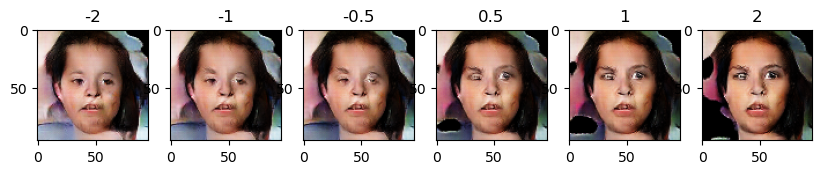

In [43]:
plot_feature_change(vals,11,noise)

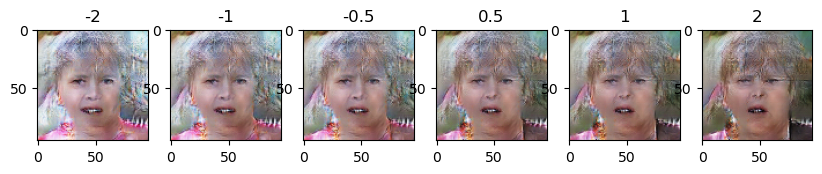

In [44]:
noise = np.random.normal(size=(1,LATENT_DIM)) #new noise
plot_feature_change(vals,11,noise)